In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import yaml

## This notebook visualizes representative simulations for Figures 4,5, 11, and 15

In [2]:
def parse_dataset2_file_name(index):
    combo_num, remainder = divmod(index, 1210)
    param1_num, remainder = divmod(remainder, 11*10)
    param2_num, itr = divmod(remainder, 10)
    
    with open("../src/parameters.yaml") as p:
        params = yaml.safe_load(p)
        dataset2_info = params["dataset2"]
        param_combinations = dataset2_info['parameter_combinations']
    
    combo = param_combinations[combo_num]
    param1, param2 = combo.split(",")
    
    param1_base = dataset2_info["parameters"][param1]
    param2_base = dataset2_info["parameters"][param2]
            
    param1_range = np.logspace(
        np.log2(param1_base / 2), np.log2(2 * param1_base), 11, base = 2
    )
    param2_range = np.logspace(
        np.log2(param2_base / 2), np.log2(2 * param2_base), 11, base = 2
    )
    file_name = f"../data/dataset2/({param1},{param2})/{param1}={param1_range[param1_num]:.5f}_{param2}={param2_range[param2_num]:.5f}_itr={itr}.npz"
    
    return file_name

def parse_dataset1_file_name(index):
    c_a_num, remainder = divmod(index, 11*10)
    eta1_num, itr = divmod(remainder, 10)
    
    with open("../src/parameters.yaml") as p:
        params = yaml.safe_load(p)
        dataset1_info = params["dataset1"]
    
    c_a_base = dataset1_info["parameters"]["c_a"]
    eta1_base = dataset1_info["parameters"]["eta1"]
            
    c_a_range = np.logspace(
        np.log2(c_a_base / 2), np.log2(2 * c_a_base), 11, base = 2
    )
    eta1_range = np.logspace(
        np.log2(eta1_base / 2), np.log2(2 * eta1_base), 11, base = 2
    )
    file_name = f"../data/dataset1/c_a={c_a_range[c_a_num]:.5f}_eta1={eta1_range[eta1_base]:.5f}_itr={itr}.npz"
    
    return file_name

# **Dataset 1**

In [3]:
num_clusters = 4
assert os.path.isfile(f"../results/dataset1/density_phenotype_inds_{num_clusters}_clusters.npy")
assert os.path.isfile(f"../results/dataset1/cell_counts_phenotype_inds_{num_clusters}_clusters.npy")

## Density Phenotypes

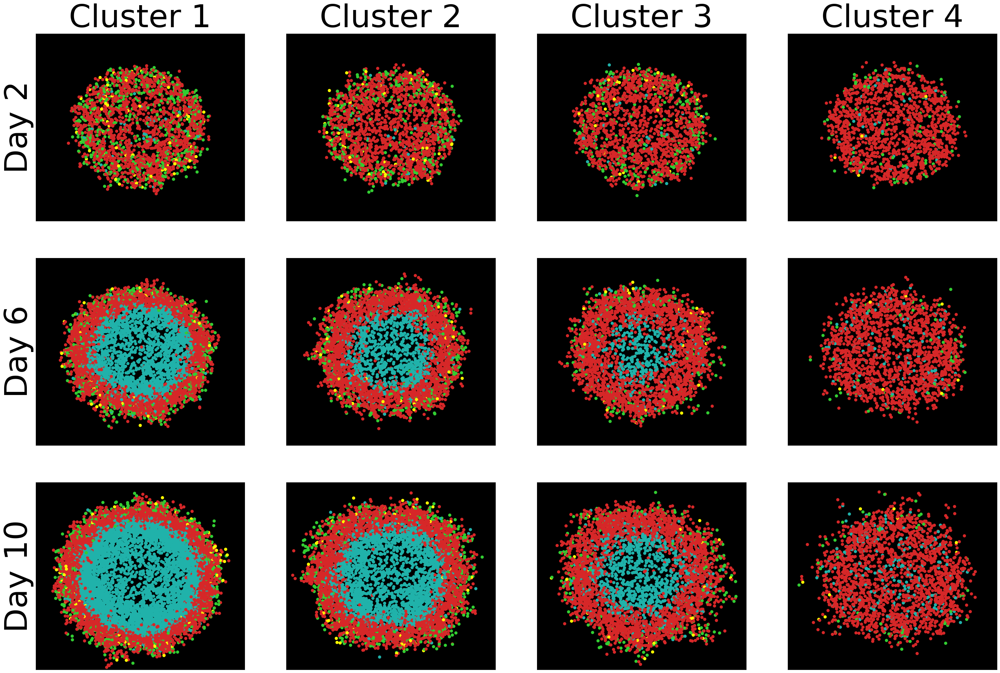

In [4]:
# Visualize density phenotypes
density_phenotype_inds = np.load(f"../results/dataset1/density_phenotype_inds_{num_clusters}_clusters.npy", allow_pickle = True)
fig, ax  = plt.subplots(3,4, figsize=(36,24))
for c, ind in enumerate(density_phenotype_inds):
    file_name = parse_dataset1_file_name(ind)
    out = np.load(file_name, allow_pickle = True)
    fontsize = 22
    L = out['L']
    Xs = out['X'] - L/2
    Ys = out['Y'] - L/2
    states = out['state'].astype(int)
    
    # Visualize Phenotype progression over 10 days
    for i, day in enumerate(np.arange(2,11,4)):
        X = Xs[day]
        Y = Ys[day]
        state = states[day]
        title = f"Day {day}"
    
        colormap = np.array(["lightseagreen", "tab:red", "yellow", "limegreen"])
        ax[i,c].scatter(X,Y,c=colormap[state], s = 32)
        ax[i,c].set_xticks([])
        ax[i,c].set_yticks([])
        ax[i,c].set_xlim(-400,400)
        ax[i,c].set_ylim(-400,400)
        ax[i,c].set_facecolor('black')
        
        if i == 0:
            ax[i,c].set_title(f"Cluster {c+1}",fontsize=3*fontsize)
        if c == 0:
            ax[i,c].set_ylabel(title,fontsize=3*fontsize)

fig.savefig(f'../figures/dataset1/density_phenotype_clusters.png')

## Cell Counts Phenotypes

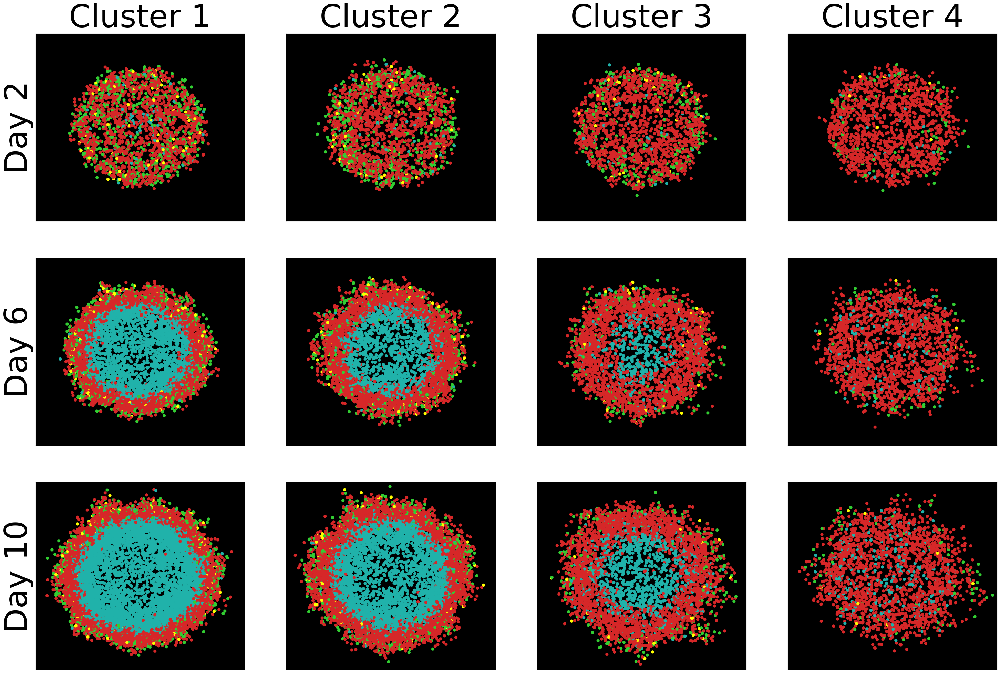

In [5]:
# Visualize cell counts phenotypes
cell_counts_phenotype_inds = np.load(f"../results/dataset1/cell_counts_phenotype_inds_{num_clusters}_clusters.npy", allow_pickle = True)

fig, ax  = plt.subplots(3,4, figsize=(36,24))
for c, ind in enumerate(cell_counts_phenotype_inds):
    file_name = parse_dataset1_file_name(ind)
    out = np.load(file_name, allow_pickle = True)
    fontsize = 22
    L = out['L']
    Xs = out['X'] - L/2
    Ys = out['Y'] - L/2
    states = out['state'].astype(int)
    
    # Visualize Phenotype progression over 10 days
    for i, day in enumerate(np.arange(2,11,4)):
        X = Xs[day]
        Y = Ys[day]
        state = states[day]
        title = f"Day {day}"
    
        colormap = np.array(["lightseagreen", "tab:red", "yellow", "limegreen"])
        ax[i,c].scatter(X,Y,c=colormap[state], s = 32)
        ax[i,c].set_xticks([])
        ax[i,c].set_yticks([])
        ax[i,c].set_xlim(-400,400)
        ax[i,c].set_ylim(-400,400)
        ax[i,c].set_facecolor('black')
        
        if i == 0:
            ax[i,c].set_title(f"Cluster {c+1}",fontsize=3*fontsize)
        if c == 0:
            ax[i,c].set_ylabel(title,fontsize=3*fontsize)

fig.savefig(f'../figures/dataset1/cell_counts_phenotype_clusters.png')

# **Dataset 2**

In [6]:
assert os.path.isfile("../results/dataset2/density_phenotype_inds.npy")
assert os.path.isfile("../results/dataset2/cell_counts_phenotype_inds.npy")

## Density Phenotypes

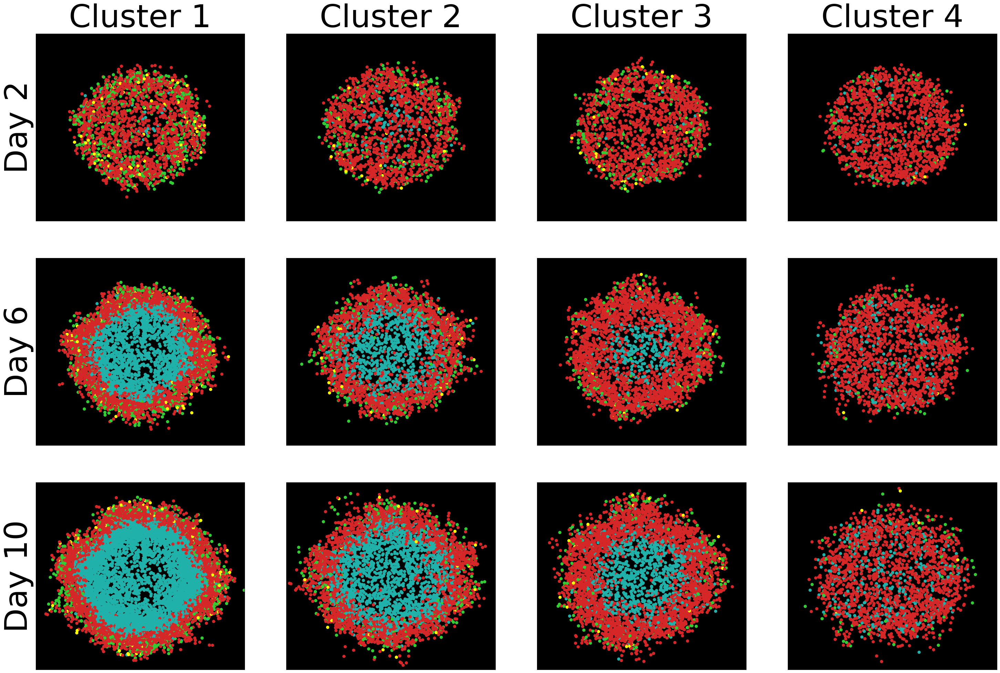

In [7]:
# Visualize density phenotypes
density_phenotype_inds = np.load("../results/dataset2/density_phenotype_inds.npy", allow_pickle = True)

fig, ax  = plt.subplots(3,4, figsize=(36,24))
for c, ind in enumerate(density_phenotype_inds):
    file_name = parse_dataset2_file_name(ind)
    out = np.load(file_name, allow_pickle = True)
    fontsize = 22
    L = out['L']
    Xs = out['X'] - L/2
    Ys = out['Y'] - L/2
    states = out['state'].astype(int)
    
    # Visualize Phenotype progression over 10 days
    for i, day in enumerate(np.arange(2,11,4)):
        X = Xs[day]
        Y = Ys[day]
        state = states[day]
        title = f"Day {day}"
    
        colormap = np.array(["lightseagreen", "tab:red", "yellow", "limegreen"])
        ax[i,c].scatter(X,Y,c=colormap[state], s = 32)
        ax[i,c].set_xticks([])
        ax[i,c].set_yticks([])
        ax[i,c].set_xlim(-400,400)
        ax[i,c].set_ylim(-400,400)
        ax[i,c].set_facecolor('black')
        
        if i == 0:
            ax[i,c].set_title(f"Cluster {c+1}",fontsize=3*fontsize)
        if c == 0:
            ax[i,c].set_ylabel(title,fontsize=3*fontsize)
        
fig.savefig(f'../figures/dataset2/density_phenotype_clusters.png')    

## Cell Counts Phenotypes

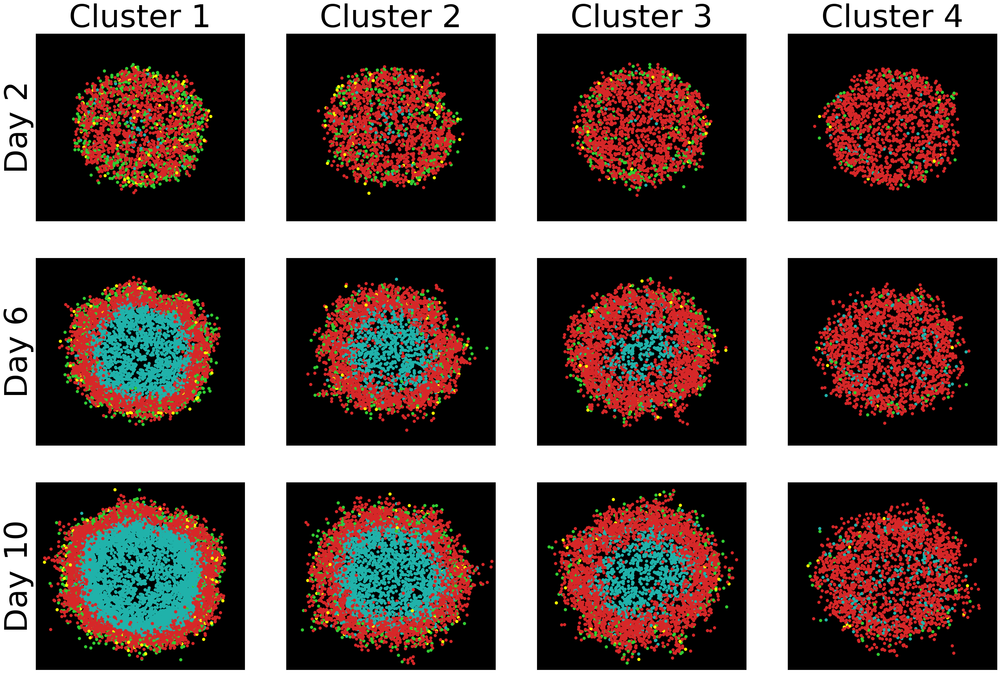

In [8]:
# Visualize cell counts phenotypes
cell_counts_phenotype_inds = np.load("../results/dataset2/cell_counts_phenotype_inds.npy", allow_pickle = True)

fig, ax  = plt.subplots(3,4, figsize=(36,24))
for c, ind in enumerate(cell_counts_phenotype_inds):
    file_name = parse_dataset2_file_name(ind)
    out = np.load(file_name, allow_pickle = True)
    fontsize = 22
    L = out['L']
    Xs = out['X'] - L/2
    Ys = out['Y'] - L/2
    states = out['state'].astype(int)
    
    # Visualize Phenotype progression over 10 days
    for i, day in enumerate(np.arange(2,11,4)):
        X = Xs[day]
        Y = Ys[day]
        state = states[day]
        title = f"Day {day}"
    
        colormap = np.array(["lightseagreen", "tab:red", "yellow", "limegreen"])
        ax[i,c].scatter(X,Y,c=colormap[state], s = 32)
        ax[i,c].set_xticks([])
        ax[i,c].set_yticks([])
        ax[i,c].set_xlim(-400,400)
        ax[i,c].set_ylim(-400,400)
        ax[i,c].set_facecolor('black')
        
        if i == 0:
            ax[i,c].set_title(f"Cluster {c+1}",fontsize=3*fontsize)
        if c == 0:
            ax[i,c].set_ylabel(title,fontsize=3*fontsize)
        
    
    #fig.tight_layout()
fig.savefig(f'../figures/dataset2/cell_counts_phenotype_clusters.png')

In [9]:
%load_ext watermark

%watermark -n -u -v -iv -w

Last updated: Wed May 28 2025

Python implementation: CPython
Python version       : 3.12.4
IPython version      : 8.25.0

yaml      : 6.0.1
numpy     : 1.26.4
matplotlib: 3.8.4

Watermark: 2.5.0

